<a href="https://colab.research.google.com/github/jmhjasso/Car-sales-forecast/blob/main/NJ_FoodBank_pov_pred%2026Dec2023.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##To predict poverty accross the US
##we will try to predict the poverty_rate based on other features

In [1]:
#1
#Getting the datasets
import pandas as pd

#obtaining poverty labels dataset
data_url_labels = 'https://docs.google.com/spreadsheets/d/e/2PACX-1vS3C-be5gO6OKi1yuqX2DBj4LADrpKaAgXjskRCQcWFn6CfPe_UkzTqzC0-C81SqbbpFOhJOytbRHjJ/pub?gid=1105185521&single=true&output=csv'
dflabel = pd.read_csv(data_url_labels)

#obtaining the rest of poverty dataset
data_url_poverty = 'https://docs.google.com/spreadsheets/d/e/2PACX-1vQhs5gtzct5-mf4RMdB0cwO9xT1Z7s86Bt2jKb335ErwhTtpsr8nBHzwulmaQkeI5Z4v8wSFBFh680W/pub?gid=182245932&single=true&output=csv'
dfpoverty = pd.read_csv(data_url_poverty)



In [2]:
#2
dfpoverty.head()

,row_id,area__rucc,area__urban_influence,econ__economic_typology,econ__pct_civilian_labor,econ__pct_unemployment,econ__pct_uninsured_adults,econ__pct_uninsured_children,demo__pct_female,demo__pct_below_18_years_of_age,...,health__pct_diabetes,health__pct_low_birthweight,health__pct_excessive_drinking,health__pct_physical_inacticity,health__air_pollution_particulate_matter,health__homicides_per_100k,health__motor_vehicle_crash_deaths_per_100k,health__pop_per_dentist,health__pop_per_primary_care_physician,yr
0,0,"Nonmetro - Completely rural or less than 2,500...",Noncore adjacent to a large metro area,Federal/State government-dependent,0.358,0.089,0.253,0.099,0.494,0.200,...,0.159,0.154,NaN,0.317,12.0,9.33,33.75,5429.0,6949.0,b
1,2,"Nonmetro - Urban population of 2,500 to 19,999...",Micropolitan adjacent to a large metro area,Manufacturing-dependent,0.503,0.057,0.171,0.065,0.503,0.243,...,0.123,0.080,0.177,0.350,14.0,2.10,23.81,3060.0,1749.0,b
2,4,"Nonmetro - Completely rural or less than 2,500...",Noncore adjacent to micro area and contains a ...,Federal/State government-dependent,0.471,0.070,0.297,0.122,0.497,0.250,...,0.092,0.079,NaN,0.259,10.0,NaN,NaN,690.0,NaN,b
3,5,"Nonmetro - Urban population of 2,500 to 19,999...",Noncore adjacent to micro area and contains a ...,Federal/State government-dependent,0.578,0.049,0.231,0.107,0.474,0.194,...,0.084,0.100,0.174,0.249,11.0,NaN,23.11,1430.0,1160.0,b
4,8,Metro - Counties in metro areas of 1 million p...,Large-in a metro area with at least 1 million ...,Nonspecialized,0.530,0.046,0.262,0.067,0.513,0.206,...,0.080,0.086,0.178,0.253,11.0,3.40,3.68,1700.0,1870.0,a


In [3]:
#3
dflabel.head()

,row_id,poverty_rate
0,0,22.6
1,2,17.3
2,4,24.4
3,5,16.4
4,8,17.4


In [4]:
#4
dfpoverty.shape

(3198, 34)

In [5]:
#5
dflabel.shape

(3198, 2)

In [6]:
#6
# Merging both datasets matching row_id column.
dfm = pd.merge(dflabel, dfpoverty, on='row_id')

# view the merged dataset
dfm.head()

,row_id,poverty_rate,area__rucc,area__urban_influence,econ__economic_typology,econ__pct_civilian_labor,econ__pct_unemployment,econ__pct_uninsured_adults,econ__pct_uninsured_children,demo__pct_female,...,health__pct_diabetes,health__pct_low_birthweight,health__pct_excessive_drinking,health__pct_physical_inacticity,health__air_pollution_particulate_matter,health__homicides_per_100k,health__motor_vehicle_crash_deaths_per_100k,health__pop_per_dentist,health__pop_per_primary_care_physician,yr
0,0,22.6,"Nonmetro - Completely rural or less than 2,500...",Noncore adjacent to a large metro area,Federal/State government-dependent,0.358,0.089,0.253,0.099,0.494,...,0.159,0.154,NaN,0.317,12.0,9.33,33.75,5429.0,6949.0,b
1,2,17.3,"Nonmetro - Urban population of 2,500 to 19,999...",Micropolitan adjacent to a large metro area,Manufacturing-dependent,0.503,0.057,0.171,0.065,0.503,...,0.123,0.080,0.177,0.350,14.0,2.10,23.81,3060.0,1749.0,b
2,4,24.4,"Nonmetro - Completely rural or less than 2,500...",Noncore adjacent to micro area and contains a ...,Federal/State government-dependent,0.471,0.070,0.297,0.122,0.497,...,0.092,0.079,NaN,0.259,10.0,NaN,NaN,690.0,NaN,b
3,5,16.4,"Nonmetro - Urban population of 2,500 to 19,999...",Noncore adjacent to micro area and contains a ...,Federal/State government-dependent,0.578,0.049,0.231,0.107,0.474,...,0.084,0.100,0.174,0.249,11.0,NaN,23.11,1430.0,1160.0,b
4,8,17.4,Metro - Counties in metro areas of 1 million p...,Large-in a metro area with at least 1 million ...,Nonspecialized,0.530,0.046,0.262,0.067,0.513,...,0.080,0.086,0.178,0.253,11.0,3.40,3.68,1700.0,1870.0,a


In [ ]:
#7
#Visualizing the full dataset sort by poverty rate
# Display all columns
pd.set_option('display.max_columns', None)

# Display all rows
pd.set_option('display.max_rows', None)
dfm.sort_values(by='row_id', inplace=True)
dfm


,row_id,poverty_rate,area__rucc,area__urban_influence,econ__economic_typology,econ__pct_civilian_labor,econ__pct_unemployment,econ__pct_uninsured_adults,econ__pct_uninsured_children,demo__pct_female,demo__pct_below_18_years_of_age,demo__pct_aged_65_years_and_older,demo__pct_hispanic,demo__pct_non_hispanic_african_american,demo__pct_non_hispanic_white,demo__pct_american_indian_or_alaskan_native,demo__pct_asian,demo__pct_adults_less_than_a_high_school_diploma,demo__pct_adults_with_high_school_diploma,demo__pct_adults_with_some_college,demo__pct_adults_bachelors_or_higher,demo__birth_rate_per_1k,demo__death_rate_per_1k,health__pct_adult_obesity,health__pct_adult_smoking,health__pct_diabetes,health__pct_low_birthweight,health__pct_excessive_drinking,health__pct_physical_inacticity,health__air_pollution_particulate_matter,health__homicides_per_100k,health__motor_vehicle_crash_deaths_per_100k,health__pop_per_dentist,health__pop_per_primary_care_physician,yr
0,0,22.6,"Nonmetro - Completely rural or less than 2,500...",Noncore adjacent to a large metro area,Federal/State government-dependent,0.358,0.089,0.253,0.099,0.494,0.200,0.195,0.044,0.517,0.378,0.056,0.000,0.223896,0.345382,0.273092,0.157631,10,11,0.345,0.219,0.159,0.154,NaN,0.317,12.0,9.33,33.75,5429.0,6949.0,b
1,2,17.3,"Nonmetro - Urban population of 2,500 to 19,999...",Micropolitan adjacent to a large metro area,Manufacturing-dependent,0.503,0.057,0.171,0.065,0.503,0.243,0.166,0.017,0.016,0.954,0.002,0.018,0.113524,0.484699,0.235933,0.165844,12,11,0.296,0.222,0.123,0.080,0.177,0.350,14.0,2.10,23.81,3060.0,1749.0,b
2,4,24.4,"Nonmetro - Completely rural or less than 2,500...",Noncore adjacent to micro area and contains a ...,Federal/State government-dependent,0.471,0.070,0.297,0.122,0.497,0.250,0.178,0.554,0.002,0.428,0.009,0.008,0.236346,0.309831,0.315789,0.138034,10,11,0.267,NaN,0.092,0.079,NaN,0.259,10.0,NaN,NaN,690.0,NaN,b
3,5,16.4,"Nonmetro - Urban population of 2,500 to 19,999...",Noncore adjacent to micro area and contains a ...,Federal/State government-dependent,0.578,0.049,0.231,0.107,0.474,0.194,0.196,0.031,0.002,0.916,0.043,0.002,0.091365,0.388554,0.349398,0.170683,7,13,0.272,0.293,0.084,0.100,0.174,0.249,11.0,NaN,23.11,1430.0,1160.0,b
4,8,17.4,Metro - Counties in metro areas of 1 million p...,Large-in a metro area with at least 1 million ...,Nonspecialized,0.530,0.046,0.262,0.067,0.513,0.206,0.101,0.433,0.096,0.294,0.011,0.149,0.171598,0.266272,0.190335,0.371795,15,6,0.232,0.165,0.080,0.086,0.178,0.253,11.0,3.40,3.68,1700.0,1870.0,a
5,9,12.2,"Nonmetro - Urban population of 2,500 to 19,999...",Micropolitan not adjacent to a metro area,Nonspecialized,0.481,0.065,0.158,0.041,0.513,0.222,0.212,0.009,0.000,0.966,0.012,0.004,0.080727,0.373360,0.345106,0.200807,11,12,0.302,0.268,0.112,0.055,NaN,0.302,11.0,NaN,20.14,4649.0,3139.0,a
6,10,12.6,"Nonmetro - Completely rural or less than 2,500...",Noncore not adjacent to a metro/micro area and...,Farm-dependent,0.458,0.045,0.193,0.102,0.485,0.194,0.286,0.025,0.005,0.954,0.005,0.000,0.064909,0.400609,0.388438,0.146045,9,12,0.320,0.099,0.151,0.049,NaN,0.303,11.0,NaN,NaN,3039.0,NaN,a
7,11,25.0,"Nonmetro - Urban population of 2,500 to 19,999...",Noncore adjacent to a small metro with town of...,Manufacturing-dependent,0.413,0.090,0.244,0.054,0.530,0.242,0.194,0.021,0.428,0.548,0.002,0.000,0.177932,0.424453,0.274354,0.123260,14,12,0.367,0.262,0.132,0.142,0.167,0.354,11.0,NaN,30.64,6989.0,7030.0,a
8,12,10.1,"Nonmetro - Urban population of 2,500 to 19,999...",Micropolitan not adjacent to a metro area,Mining-dependent,0.475,0.058,0.210,0.083,0.497,0.295,0.101,0.088,0.000,0.895,0.010,0.006,0.096057,0.364004,0.341759,0.198180,15,7,0.304,0.174,0.075,0.093,0.133,0.263,12.0,NaN,24.01,1510.0,2619.0,b
9,13,26.0,"Nonmetro - Completely rural or less than 2,500...",Noncore not adjacent to a metro/micro area and...,Manufacturing-dependent,0.375,0.080,0.229,0.062,0.504,0.222,0.184,0.029,0.005,0.953,0.008,0.000,0.310797,0.365288,0.229062,0.094854,14

In [7]:
#8
# Get the columns name and type
columns_name_type = dfm.dtypes
print(columns_name_type)

row_id                                                int64
poverty_rate                                        float64
area__rucc                                           object
area__urban_influence                                object
econ__economic_typology                              object
econ__pct_civilian_labor                            float64
econ__pct_unemployment                              float64
econ__pct_uninsured_adults                          float64
econ__pct_uninsured_children                        float64
demo__pct_female                                    float64
demo__pct_below_18_years_of_age                     float64
demo__pct_aged_65_years_and_older                   float64
demo__pct_hispanic                                  float64
demo__pct_non_hispanic_african_american             float64
demo__pct_non_hispanic_white                        float64
demo__pct_american_indian_or_alaskan_native         float64
demo__pct_asian                         

In [8]:
#8.1
#saving the dataset
# Save the DataFrame to a CSV file
dfm.to_csv('NJPoverty.csv', index=False)

###EDA STARTS###

In [9]:
# 9
#Installing dataprep package for data profiling
!pip install dataprep

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 16.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.5/18.5 MB 47.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.6/133.6 kB 13.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 39.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 52.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 55.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 764.0/764.0 kB 41.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.4/6.4 MB 75.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 60.9 MB/s eta 0:00:00
  Created wheel for sqlalchemy: filename=SQLAlchemy-1.3.24-cp310-cp310-linux_x86_64.whl size=1252696 sha256=4750d0ef5

In [10]:
#10
# Importing dataprep package for data profiling
from dataprep.eda import create_report

In [11]:
#11
# Generating the data profiling report
create_report(dfm).save()

Computing moment_agg-aggregate-196d0c075a9a92eae905a5ee6a95333f:   4%|▍         | 295/7666 [00:00<00:13, 564.59it/s]/usr/local/lib/python3.10/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame({col: [nrows - npresent]}, index=["Others"]))
ERROR:bokeh.core.validation.check:E-1019 (DUPLICATE_FACTORS): FactorRange must specify a unique list of categorical factors for an axis: duplicate factors found: 'demo__pct_adu...oma'


Report has been saved to /content/report.html!


poverty_rate:

Mean: 16.81
The mean poverty rate of 16.81 indicates the average poverty rate across the dataset.

Standard Deviation: 6.698
The standard deviation of 6.698 measures the amount of variation or dispersion of the poverty rates from the mean. A higher standard deviation indicates that the poverty rates are more spread out from the mean.

Variance: 44.8628
The variance of 44.8628 is the square of the standard deviation and represents the average of the squared differences from the mean. It provides another measure of the spread of the poverty rates.

Skewness: 1.0479
The skewness of 1.0479 indicates the asymmetry of the distribution of poverty rates. A positive skewness suggests that the distribution is skewed to the right, meaning there are more data points on the left side of the distribution with a long tail to the right.

Kurtosis: 1.662
The kurtosis of 1.662 measures the tailedness of the distribution of poverty rates. A kurtosis greater than 3 indicates heavy tails and a sharper peak than the normal distribution.
Coefficient of Variation: 0.3983

The coefficient of variation (CV) of 0.3983 is a measure of relative variability and represents the standard deviation as a percentage of the mean. It provides a standardized measure of dispersion, allowing comparison of variability across different datasets.

In [12]:
#12
# Installing sweetviz package for visualization and statistical analysis
!pip install sweetviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.1/15.1 MB 28.3 MB/s eta 0:00:00


In [13]:
#13
# Get the list of column names in the dataframe
column_names = list(dfm.columns)

# Print the list of column names
print(column_names)

['row_id', 'poverty_rate', 'area__rucc', 'area__urban_influence', 'econ__economic_typology', 'econ__pct_civilian_labor', 'econ__pct_unemployment', 'econ__pct_uninsured_adults', 'econ__pct_uninsured_children', 'demo__pct_female', 'demo__pct_below_18_years_of_age', 'demo__pct_aged_65_years_and_older', 'demo__pct_hispanic', 'demo__pct_non_hispanic_african_american', 'demo__pct_non_hispanic_white', 'demo__pct_american_indian_or_alaskan_native', 'demo__pct_asian', 'demo__pct_adults_less_than_a_high_school_diploma', 'demo__pct_adults_with_high_school_diploma', 'demo__pct_adults_with_some_college', 'demo__pct_adults_bachelors_or_higher', 'demo__birth_rate_per_1k', 'demo__death_rate_per_1k', 'health__pct_adult_obesity', 'health__pct_adult_smoking', 'health__pct_diabetes', 'health__pct_low_birthweight', 'health__pct_excessive_drinking', 'health__pct_physical_inacticity', 'health__air_pollution_particulate_matter', 'health__homicides_per_100k', 'health__motor_vehicle_crash_deaths_per_100k', 'hea

In [14]:
#14
# Generating a dataset with only independent variables
pred_cols = ['row_id', 'poverty_rate', 'area__rucc', 'area__urban_influence',
             'econ__economic_typology', 'econ__pct_civilian_labor', 'econ__pct_unemployment',
             'econ__pct_uninsured_adults', 'econ__pct_uninsured_children', 'demo__pct_female',
             'demo__pct_below_18_years_of_age',
             'demo__pct_aged_65_years_and_older', 'demo__pct_hispanic',
             'demo__pct_non_hispanic_african_american', 'demo__pct_non_hispanic_white',
             'demo__pct_american_indian_or_alaskan_native',
             'demo__pct_asian', 'demo__pct_adults_less_than_a_high_school_diploma',
             'demo__pct_adults_with_high_school_diploma', 'demo__pct_adults_with_some_college',
             'demo__pct_adults_bachelors_or_higher', 'demo__birth_rate_per_1k', 'demo__death_rate_per_1k',
             'health__pct_adult_obesity', 'health__pct_adult_smoking', 'health__pct_diabetes', 'health__pct_low_birthweight',
             'health__pct_excessive_drinking', 'health__pct_physical_inacticity', 'health__air_pollution_particulate_matter',
             'health__homicides_per_100k', 'health__motor_vehicle_crash_deaths_per_100k',
             'health__pop_per_dentist', 'health__pop_per_primary_care_physician', 'yr']
pred_data = dfm[pred_cols]

In [16]:
#15
#getting the missing values
missing_values = dfm.isnull().sum()
print(missing_values)

row_id                                                 0
poverty_rate                                           0
area__rucc                                             0
area__urban_influence                                  0
econ__economic_typology                                0
econ__pct_civilian_labor                               0
econ__pct_unemployment                                 0
econ__pct_uninsured_adults                             2
econ__pct_uninsured_children                           2
demo__pct_female                                       2
demo__pct_below_18_years_of_age                        2
demo__pct_aged_65_years_and_older                      2
demo__pct_hispanic                                     2
demo__pct_non_hispanic_african_american                2
demo__pct_non_hispanic_white                           2
demo__pct_american_indian_or_alaskan_native            2
demo__pct_asian                                        2
demo__pct_adults_less_than_a_hi

In [17]:
#`15.1
# Importing the package
import sweetviz as sv


In [18]:
#16
# Generating EDA report using sweetviz
sv_report = sv.analyze(pred_data)

                                             |          | [  0%]   00:00 -> (? left)

In [19]:
#17
# Generate a html formatted report
sv_report.show_html("SweetVizNJFoodBank EDA23Dec23.html")

Report SweetVizNJFoodBank EDA23Dec23.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


##Data Featuring and Treatment##

In [20]:
#18
#first we will fill the null values with 0

dfmt=dfm.interpolate(method='linear')
dfmt

,row_id,poverty_rate,area__rucc,area__urban_influence,econ__economic_typology,econ__pct_civilian_labor,econ__pct_unemployment,econ__pct_uninsured_adults,econ__pct_uninsured_children,demo__pct_female,...,health__pct_diabetes,health__pct_low_birthweight,health__pct_excessive_drinking,health__pct_physical_inacticity,health__air_pollution_particulate_matter,health__homicides_per_100k,health__motor_vehicle_crash_deaths_per_100k,health__pop_per_dentist,health__pop_per_primary_care_physician,yr
0,0,22.6,"Nonmetro - Completely rural or less than 2,500...",Noncore adjacent to a large metro area,Federal/State government-dependent,0.358,0.089,0.253,0.099,0.494,...,0.159,0.1540,NaN,0.317,12.0,9.330000,33.750,5429.0,6949.0,b
1,2,17.3,"Nonmetro - Urban population of 2,500 to 19,999...",Micropolitan adjacent to a large metro area,Manufacturing-dependent,0.503,0.057,0.171,0.065,0.503,...,0.123,0.0800,0.1770,0.350,14.0,2.100000,23.810,3060.0,1749.0,b
2,4,24.4,"Nonmetro - Completely rural or less than 2,500...",Noncore adjacent to micro area and contains a ...,Federal/State government-dependent,0.471,0.070,0.297,0.122,0.497,...,0.092,0.0790,0.1755,0.259,10.0,2.533333,23.460,690.0,1454.5,b
3,5,16.4,"Nonmetro - Urban population of 2,500 to 19,999...",Noncore adjacent to micro area and contains a ...,Federal/State government-dependent,0.578,0.049,0.231,0.107,0.474,...,0.084,0.1000,0.1740,0.249,11.0,2.966667,23.110,1430.0,1160.0,b
4,8,17.4,Metro - Counties in metro areas of 1 million p...,Large-in a metro area with at least 1 million ...,Nonspecialized,0.530,0.046,0.262,0.067,0.513,...,0.080,0.0860,0.1780,0.253,11.0,3.400000,3.680,1700.0,1870.0,a
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3193,6270,24.8,"Metro - Counties in metro areas of 250,000 to ...",Small-in a metro area with fewer than 1 millio...,Nonspecialized,0.391,0.079,0.279,0.099,0.499,...,0.082,0.0750,0.1140,0.247,9.0,10.530000,22.470,6010.0,3349.0,b
3194,6273,31.6,"Nonmetro - Completely rural or less than 2,500...",Noncore adjacent to a small metro and does not...,Nonspecialized,0.344,0.117,0.302,0.104,0.511,...,0.160,0.1420,0.1300,0.339,13.0,10.530000,19.355,4564.5,2844.0,b
3195,6275,12.1,Metro - Counties in metro areas of 1 million p...,Large-in a metro area with at least 1 million ...,Nonspecialized,0.458,0.044,0.162,0.060,0.474,...,0.117,0.0820,0.1460,0.318,13.0,10.530000,16.240,3119.0,2339.0,a
3196,6276,14.1,"Nonmetro - Completely rural or less than 2,500...",Noncore not adjacent to a metro/micro area and...,Farm-dependent,0.549,0.023,0.217,0.100,0.504,...,0.080,0.0875,0.2120,0.303,12.0,10.530000,16.240,2079.0,689.0,b


In [21]:
#19
#confirming that the missing values have been replaced
missing_values = dfmt.isnull().sum()
print(missing_values)


row_id                                              0
poverty_rate                                        0
area__rucc                                          0
area__urban_influence                               0
econ__economic_typology                             0
econ__pct_civilian_labor                            0
econ__pct_unemployment                              0
econ__pct_uninsured_adults                          0
econ__pct_uninsured_children                        0
demo__pct_female                                    0
demo__pct_below_18_years_of_age                     0
demo__pct_aged_65_years_and_older                   0
demo__pct_hispanic                                  0
demo__pct_non_hispanic_african_american             0
demo__pct_non_hispanic_white                        0
demo__pct_american_indian_or_alaskan_native         0
demo__pct_asian                                     0
demo__pct_adults_less_than_a_high_school_diploma    0
demo__pct_adults_with_high_s

In [24]:
#20
#Installing pycaret to run some data featuring
!pip install -U --pre pycaret

In [25]:
#21
#you can do it individually: https://www.youtube.com/watch?v=AmCkjGPmdvI
#However, it is recommended to use Z Score Normalization with pycaret
from pycaret.regression import *

# Initialize the setup for normalization using PyCaret
s = setup(dfmt, normalize=True, normalize_method='zscore')
# 's' will contain the processed dataset with the Z-score normalization applied


,Description,Value
0,Session id,678
1,Target,yr
2,Target type,Regression
3,Original data shape,"(3198, 35)"
4,Transformed data shape,"(3198, 59)"
5,Transformed train set shape,"(2238, 59)"
6,Transformed test set shape,"(960, 59)"
7,Numeric features,31
8,Categorical features,3
9,Rows with missing values,0.0%


AttributeError: ignored

In [ ]:
#20
# Generating a dataset with only predictor columns with treated dataset to start the predictions
pred_cols = ['row_id', 'poverty_rate', 'area__rucc', 'area__urban_influence',
             'econ__economic_typology', 'econ__pct_civilian_labor', 'econ__pct_unemployment',
             'econ__pct_uninsured_adults', 'econ__pct_uninsured_children', 'demo__pct_female',
             'demo__pct_below_18_years_of_age',
             'demo__pct_aged_65_years_and_older', 'demo__pct_hispanic',
             'demo__pct_non_hispanic_african_american', 'demo__pct_non_hispanic_white',
             'demo__pct_american_indian_or_alaskan_native',
             'demo__pct_asian', 'demo__pct_adults_less_than_a_high_school_diploma',
             'demo__pct_adults_with_high_school_diploma', 'demo__pct_adults_with_some_college',
             'demo__pct_adults_bachelors_or_higher', 'demo__birth_rate_per_1k', 'demo__death_rate_per_1k',
             'health__pct_adult_obesity', 'health__pct_adult_smoking', 'health__pct_diabetes', 'health__pct_low_birthweight',
             'health__pct_excessive_drinking', 'health__pct_physical_inacticity', 'health__air_pollution_particulate_matter',
             'health__homicides_per_100k', 'health__motor_vehicle_crash_deaths_per_100k',
             'health__pop_per_dentist', 'health__pop_per_primary_care_physician', 'yr']
pred_data = dfmt[pred_cols]

In [ ]:
#21
# Importing the package
import sweetviz as sv

In [ ]:
#22
# Generating EDA report using sweetviz
sv_report = sv.analyze(pred_data)

                                             |          | [  0%]   00:00 -> (? left)

In [ ]:
#23
# Generate a html formatted report
sv_report.show_html("NJFoodBankTreated.html")

Report NJFoodBankTreated.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


###Predictions Section###

In [ ]:
#24
#Classification of features
ignored_cols=['health__pct_excessive_drinking', 'health__homicides_per_100k', 'health__air_pollution_particulate_matter', 'yr', 'row_id']

cat_cols=['area__rucc', 'area__urban_influence', 'econ__economic_typology']

num_cols = ['econ__pct_civilian_labor' , 'econ__pct_unemployment', 'econ__pct_uninsured_adults', 'econ__pct_uninsured_children', 'demo__pct_female',
            'demo__pct_below_18_years_of_age', 'demo__pct_aged_65_years_and_older',  'demo__pct_hispanic', 'demo__pct_non_hispanic_african_american',
            'demo__pct_non_hispanic_white', 'demo__pct_american_indian_or_alaskan_native', 'demo__pct_asian', 'demo__pct_adults_less_than_a_high_school_diploma',
            'demo__pct_adults_with_high_school_diploma', 'demo__pct_adults_with_some_college', 'demo__pct_adults_bachelors_or_higher', 'demo__birth_rate_per_1k',
            'demo__death_rate_per_1k', 'health__pct_adult_obesity', 'health__pct_adult_smoking', 'health__pct_diabetes', 'health__pct_low_birthweight',
            'health__pct_physical_inacticity',
            'health__motor_vehicle_crash_deaths_per_100k', 'health__pop_per_dentist', 'health__pop_per_primary_care_physician']

# Setting the dependent/target/label variable
y='poverty_rate'

In [ ]:
#25
# Installing Pycaret for Automated ML
!pip install -U --pre pycaret

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 484.7/484.7 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 11.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 62.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.3/80.3 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 72.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.5/160.5 kB 17.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.4/34.4 MB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 48.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 48.0 MB/s e

In [ ]:
#26
# Setting/configuring the ML experiment
from pycaret.regression import *

setup(dfmt,
target = y,
categorical_features = cat_cols,
numeric_features = num_cols,
ignore_features = ignored_cols)

,Description,Value
0,Session id,7215
1,Target,poverty_rate
2,Target type,Regression
3,Original data shape,"(3198, 35)"
4,Transformed data shape,"(3198, 54)"
5,Transformed train set shape,"(2238, 54)"
6,Transformed test set shape,"(960, 54)"
7,Ignore features,5
8,Numeric features,26
9,Categorical features,3


In [ ]:
#27
# Invoking ML agorithms
compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,1.8830,6.2162,2.4852,0.8602,0.1485,0.1264,1.7890
xgboost,Extreme Gradient Boosting,2.1089,7.5038,2.7344,0.8311,0.1587,0.1376,0.9160
rf,Random Forest Regressor,2.1030,7.6669,2.7607,0.8272,0.1622,0.1398,3.6480
gbr,Gradient Boosting Regressor,2.1556,8.0636,2.8339,0.8162,0.1659,0.1425,1.3260
br,Bayesian Ridge,2.4123,10.3980,3.2215,0.7651,0.1901,0.1597,0.1200
lr,Linear Regression,2.4208,10.4046,3.2227,0.7649,0.1908,0.1603,0.6360
ridge,Ridge Regression,2.4545,10.9108,3.2990,0.7536,0.1938,0.1635,0.1430
ada,AdaBoost Regressor,2.7868,12.3152,3.5054,0.7190,0.2241,0.2081,0.5220
dt,Decision Tree Regressor,2.8427,15.1076,3.8746,0.6588,0.2259,0.1861,0.2070
huber,Huber Regressor,4.1198,31.0887,5.5679,0.3051,0.3037,0.2721,0.1790


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

ExtraTreesRegressor(n_jobs=-1, random_state=7215)

In [ ]:
#28
#Creating the model
# Creating the model
#If the values of the mean of the results of this instruction match with the results from pycaret, then the model is a good fit
model = create_model('et')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,1.9954,7.7981,2.7925,0.8347,0.1584,0.1341
1,1.8754,6.1525,2.4804,0.8845,0.1413,0.1216
2,1.8871,5.9161,2.4323,0.8903,0.1579,0.1321
3,1.9353,6.4871,2.5470,0.8306,0.1456,0.1259
4,1.7745,6.1110,2.4720,0.8791,0.1555,0.1204
5,2.0946,8.1366,2.8525,0.8295,0.1444,0.1249
6,1.9004,5.8069,2.4098,0.8753,0.1391,0.1229
7,1.8888,6.0034,2.4502,0.8310,0.1573,0.1344
8,1.7531,4.6685,2.1607,0.8867,0.1436,0.1276


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
#29
#Getting the data for Test / Predictions
data_predictions = dfm
# Shuffle the dataframe
data_predictions = data_predictions.sample(frac=1).reset_index(drop=True)

In [ ]:
#30
# Predicting DonorIndicatorFlag using the best model
pred_pove_rate = predict_model(model, data_predictions)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Extra Trees Regressor,0.5880,2.0781,1.4416,0.9537,0.0839,0.0398


In [ ]:
#31
# Converting client data pandas dataframe to a csv file
pred_pove_rate.to_csv("poverty rate pred 3Dec23.csv")


In [ ]:
#32
pred_pove_rate.head()

,row_id,area__rucc,area__urban_influence,econ__economic_typology,econ__pct_civilian_labor,econ__pct_unemployment,econ__pct_uninsured_adults,econ__pct_uninsured_children,demo__pct_female,demo__pct_below_18_years_of_age,...,health__pct_excessive_drinking,health__pct_physical_inacticity,health__air_pollution_particulate_matter,health__homicides_per_100k,health__motor_vehicle_crash_deaths_per_100k,health__pop_per_dentist,health__pop_per_primary_care_physician,yr,poverty_rate,prediction_label
0,5379,"Nonmetro - Urban population of 2,500 to 19,999...",Micropolitan adjacent to a small metro area,Federal/State government-dependent,0.393,0.080,0.256,0.077,0.512,0.196,...,0.149,0.192,10.0,11.2,28.809999,2590.0,1249.0,a,28.799999,23.420
1,4967,"Metro - Counties in metro areas of 250,000 to ...",Small-in a metro area with fewer than 1 millio...,Nonspecialized,0.458,0.056,0.243,0.095,0.497,0.239,...,0.163,0.261,12.0,6.2,19.129999,3730.0,3210.0,a,13.100000,15.901
2,2594,"Nonmetro - Urban population of 2,500 to 19,999...",Noncore adjacent to micro area and contains a ...,Federal/State government-dependent,0.412,0.103,0.288,0.125,0.495,0.187,...,0.155,0.230,12.0,NaN,24.620001,1939.0,1619.0,a,20.000000,18.457
3,5707,"Nonmetro - Completely rural or less than 2,500...",Noncore not adjacent to a metro/micro area and...,Nonspecialized,0.270,0.154,0.259,0.076,0.501,0.231,...,NaN,0.368,13.0,NaN,30.270000,2589.0,3260.0,a,32.099998,34.829
4,2946,"Metro - Counties in metro areas of 250,000 to ...",Small-in a metro area with fewer than 1 millio...,Recreation,0.550,0.063,0.134,0.058,0.495,0.209,...,0.272,0.232,11.0,NaN,20.620001,2899.0,3400.0,b,10.100000,10.994


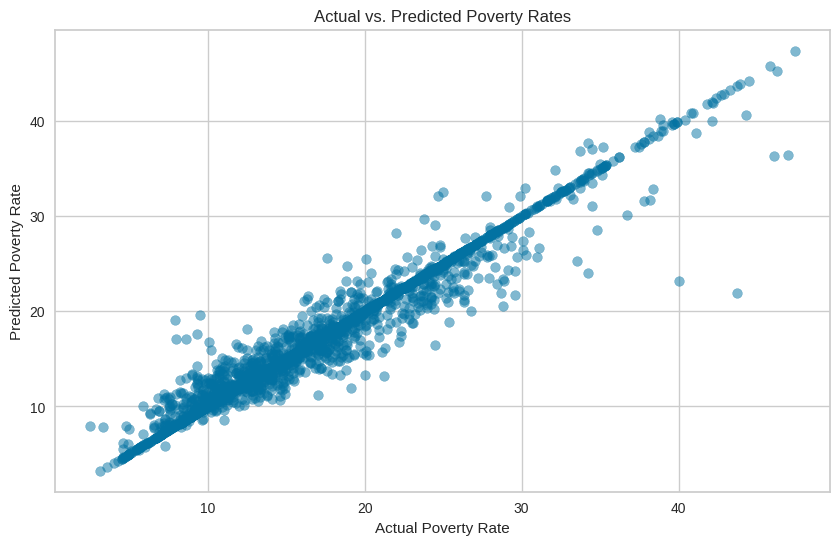

In [ ]:
#33
import matplotlib.pyplot as plt

#plotting the values to compare the actual vs predicted values of poverty\ rate\ pred\ 3Dec23.csv
actual_values = pred_pove_rate['poverty_rate']
predicted_values = pred_pove_rate['prediction_label']

plt.figure(figsize=(10, 6))
plt.scatter(actual_values, predicted_values, color='b', alpha=0.5)
plt.title('Actual vs. Predicted Poverty Rates')
plt.xlabel('Actual Poverty Rate')
plt.ylabel('Predicted Poverty Rate')
plt.show()